# Анализ рынка заведений общественного питания Москвы

## Описание проекта

**Цель:** 

Провести исследование рынка общественного питания Москвы для помощи определения места и вида будущего заведения общественного питания. 

**Задачи:** 

- На открытых данных подготовить исследование рынка, найти интересные особенности и презентовать полученные результаты;
- Оформить основные тезисы в виде информативной и лаконичной презентации.

**Ход работы:**

- Загрузить данные и изучить общую информацию о заведениях общественного питания Москвы;
- Выполнить предобработку данных;
- Анализ данных:
    - исследовать категории в представленных данных;
    - исследовать количество посадочных мест в метсах по категориям;
    - рассмотреть соотношение сетевых и несетевых заведений в датасете;
    - определить какие категории заведений чаще являются сетевыми;
    - найти топ-15 популярных сетей в Москве;
    - исследовать какие районы Москвы представлены в датасете;
    - визуализировать средние рейтинги по категориям и районам;
    - отобразить заведения на карте;
    - найти топ-15 улиц по количеству заведений; 
    - определить влияние удаленности от центра на формирование цен в заведениях общепита;
    - сделать вывод;
- Детализирование исследования: открытие кофейни:
    - узнать сколько кофеен в датасете;
    - узнать, есть ли круглосуточные кофейни;
    - узнать рейтинги кофеен;
    - узнать, на какую стоимость чашки капучино стоит ориентироваться при открытие;
- Подготовить презентацию.
- Выводы.

## Подключение библиотек

Подключим необходимые для работы библиотеки.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from scipy import stats as st
import plotly.express as px
from plotly import graph_objects as go
import re
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
import warnings
import json

## Считывание файлов

Считаем данные о заведениях общественного питания Москвы из файла.

In [2]:
#Считаем данные из файла
data = pd.read_csv('dataset/moscow_places.csv')

In [3]:
data.info()
data.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


**Вывод:**

В таблице представлена информация о 8406 заведениях общественного питания Москвы.

- На первый взгляд видим, что в столбцах разное количество ненулевых элементов, значит, могут быть пропуски, проверим это на этапе предобработки; 
- Названия столбцов соответствуют стилю snakecase и на этапе предобработки менять названия не нужно;  
- Типы данных столбцов соответсвуют заполненным данным, кроме столбца ``seats``, заменим его на int32, так как количество посадочных мест не может быть не целым числом, а также поменяем тип столбца ``chain`` на тип bool, так как этот столбец хранит 0 и 1 значения и показывает является ли заведение сетевым.

## Предобработка данных

Для начала проверим пропуски в столбцах, узнаем с чем они связаны и можно ли их обработать.

In [4]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

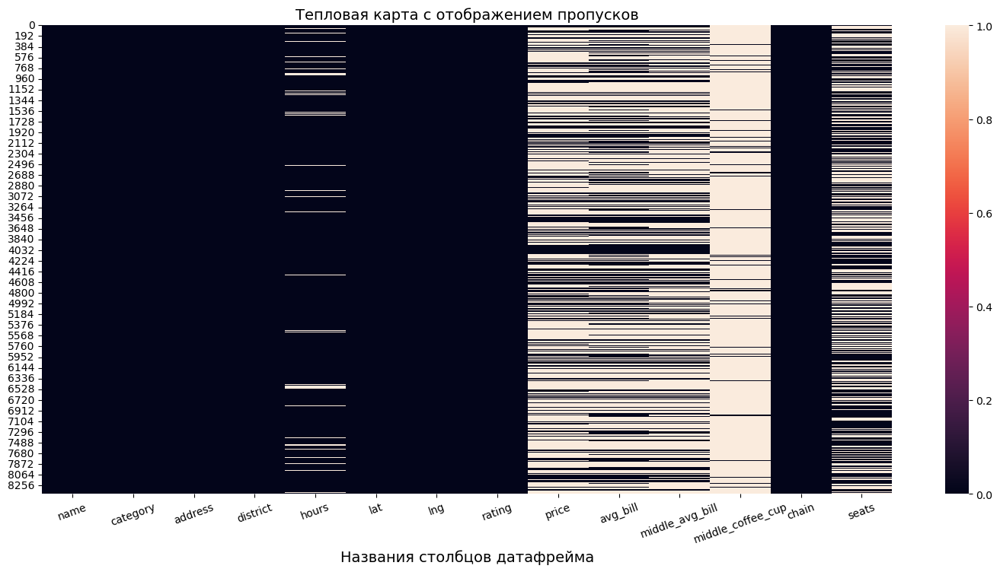

In [5]:
plt.figure(figsize=(18, 8))
sns.heatmap(data.isna(), cbar=True)
plt.title('Тепловая карта с отображением пропусков', fontsize=14)
plt.xlabel('Названия столбцов датафрейма', fontsize=14)
plt.xticks(rotation=20)
plt.show()

Как видим, в некоторых столбцах пропущенно очень много значений. Так как единичных пропусков нет в датафрейме, то удалять большое количество пропусков может быть критично и потеряется большой процент данных.

В столбце с временем работы ``hours`` заменить пропуски мы не сможем, так как время работы заведений нам не известно. 

В остальных столбцах, где пропущено много значений тоже вряд ли можно заменить пропуски, так как заменя на среднее значение в большом количестве может исказить результаты исследования.

В столбце с количеством посадочных мест значение NaN может встречаться когда в заведении нет посадочных мест и еда выдается на вынос, например, кофе с собой, или же заведение может находиться на фудкорте в ТЦ, тогда у заведения не будет конкретного собственного количества мест. Поэтому в данном случае заменим пропуски на 0 значения. 

In [6]:
data['seats'] = data['seats'].fillna(value=0)

In [7]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                   0
dtype: int64

Проверим, есть ли в датафрейме дубликаты.

In [8]:
data.duplicated().sum()

0

In [9]:
dupl = data[data.duplicated(subset=['name', 'address'])]
dupl

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


Полные дубликаты в таблице отсутствуют.

Проверим есть ли неявные дубликаты, выведем уникальные наименования заведений, а также поищем схожие названия заведений по ключевым словам.


In [10]:
data['name'].unique()

array(['WoWфли', 'Четыре комнаты', 'Хазри', ..., 'Миславнес', 'Самовар',
       'Kebab Time'], dtype=object)

In [11]:
data[data['name'].str.contains('пицца', case=False)]['name'].unique()

array(['Додо Пицца', "Домино'с Пицца", 'Виладж пицца', 'Суши & пицца',
       'Алло! Пицца', 'Вуди пицца', 'Пицца Фалафилло Халяль',
       'Неаполитан пицца', 'Доминос пицца', 'Пицца 28 сантиметров',
       'Пицца', 'Гран Торино Пицца', 'Виват Пицца', 'Премьер Пицца',
       'Корнели Пицца', 'Пицца на районе', 'Пицца & Гирос & Шаурма',
       'Пиво пицца', 'ПиццаДар', 'Сити Пицца', 'Дэнди Пицца', 'Чао-пицца',
       'Максима Пицца', 'Белла ЧАО пицца и кофе', 'Пицца и Канноли',
       'Таекпицца', 'Дореми пицца', 'Тода Пицца', 'Моллетта Пицца&Паста',
       "Домино'с пицца", 'Суши пицца', 'Нью-Йорк пицца и гриль',
       'Пицца и гирос', 'Маэстро пицца', 'Пицца Паоло', 'Пицца-фабрика',
       'Пицца Пеппе', 'Иль пиццайоло', 'Пицца-Паста', 'Нияма&Пицца-Пи',
       'Пицца бар Лавка', 'Пицца экспресс', 'КИНОпицца', 'Пиццаменто',
       'Пицца фабрика', 'Пицца Грасса', 'ПиццаСушиВок', 'Дока Пицца',
       'Ташир пицца', 'Пицца № 1', 'Галло пицца&бургег', 'Аллора пицца',
       'Суши-Пицца 

Как видим неявные дубликаты присутствуют в названиях заведений. Заменим их.

In [12]:
data['name'] = data['name'].str.replace('ABC coffee roasters', 'ABC Coffee Roasters')
data['name'] = data['name'].str.replace('Bb grill', 'Bb Grill')
data['name'] = data['name'].str.replace('Deli2go', 'Deli2Go')
data['name'] = data['name'].str.replace('Di villaggio', 'Di Villaggio')
data['name'] = data['name'].str.replace('Espresso bar', 'Espresso Bar')
data['name'] = data['name'].str.replace('Hellopapaya', 'HelloPapaya')
data['name'] = data['name'].replace('Яндекс.Лавка', 'Яндекс Лавка')
data['name'] = data['name'].replace(['Доминос пицца', "Домино'с", "Домино'с Пицца"], "Домино'с пицца")
data['name'] = data['name'].replace('Аль баракат', 'Аль-барака')
data['name'] = data['name'].replace('Алло Пицца', 'Алло! Пицца')
data['name'] = data['name'].replace('Вкусвилл, кафе', 'ВкусВилл, кафе')
data['name'] = data['name'].replace('Лепим и Варим', 'Лепим и варим')
data['name'] = data['name'].replace('Крошка Картошка', 'Крошка картошка')
data['name'] = data['name'].replace('Правда Кофе', 'Правда кофе')

data['name'] = data['name'].replace('Новатор Кофе', 'Новатор кофе')
data['name'] = data['name'].replace('Практика Кофе', 'Практика кофе')
data['name'] = data['name'].replace('Чудо-печка', 'Чудо Печка')
data['name'] = data['name'].replace('Чебуреки Манты', 'Чебуреки и манты')
data['name'] = data['name'].replace('Чайхона № 1', 'Чайхона №1')
data['name'] = data['name'].replace('Чайхона ОШ Сити', 'Чайхона Ош сити')
data['name'] = data['name'].replace('Трдельникъ', 'Трдельник')
data['name'] = data['name'].replace('Франклинс Бургер', 'Франклинс бургер')
data['name'] = data['name'].replace(['Хлеб Насущный Экспресс', 'Хлеб Насущный'], 'Хлеб насущный')

Заменили неявные дубликаты. Теперь заменим типы столбцов на соответствующие.

In [13]:
#Заменим количество посадочных мест на int32 для экономии памяти
data['seats'] = data['seats'].astype('Int32')

data['chain'] = data['chain'].astype('bool')

data.info()
data.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   bool   
 13  seats              8406 non-null   Int32  
dtypes: Int32(1), bool(1), float64(5), object(7)
memory usage: 837.4+ KB


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,False,0
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,False,4
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,False,45
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,False,0
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,True,148


In [14]:
data['chain'].unique()

array([False,  True])

После замены типа столбца chain на bool, уникальные значения столбца стали True, если заведение сетевое и False, если заведение не сетевое.

In [15]:
data['seats'].describe()

count        8406.0
mean      61.846538
std      107.175995
min             0.0
25%             0.0
50%            20.0
75%            85.0
max          1288.0
Name: seats, dtype: Float64

Минимальное количество посадочных мест в заведениях = 0, а максимальное 1288. Проверим в каких заведениях 1288 мест.

Создадим столбец ``street`` с названием улиц из столбца с адресом.

In [16]:
#Напишем функцию с регулярным выражением для извлечения улицы из адреса
def extract_street(address):
    search_result = re.search(', (.*[^\d][^,]), | (.*)', address)
    if search_result.group(1) != None:
        return search_result.group(1)
    else:
        return search_result.group(2) 

In [17]:
#Извлекаем улицы из адреса
streets = []
for i in data['address']:
    street = extract_street(i)
    cut_index = street.find(',')
    if cut_index != -1:
        street = street[:cut_index]
    streets.append(street)

#Проверяем есть ли пустые значения в улицах
print(None in streets)

#Проверяем общее количество улиц, чтобы совпадало с размером таблицы
len(streets)

False


8406

Пустых значений улиц нет, количество улиц совпадает с длиной датафрейма.


In [18]:
#Формируем новый столбец
data['street'] = streets
data.sample(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
3428,Моремания,ресторан,"Москва, Большая Грузинская улица, 39",Центральный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.770705,37.581896,4.6,выше среднего,Средний счёт:1000–1500 ₽,1250.0,NaN,True,68,Большая Грузинская улица
1829,БирХеванс ресторан бар,"бар,паб","Москва, улица Расковой, 14",Северный административный округ,"пн-пт 11:00–00:00; сб,вс 12:00–00:00",55.786594,37.572227,4.3,средние,Цена бокала пива:200–440 ₽,NaN,NaN,False,95,улица Расковой
7455,Суши Пати,пиццерия,"Москва, улица Перерва, 45",Юго-Восточный административный округ,"ежедневно, 11:00–23:30",55.659896,37.748385,4.1,средние,NaN,NaN,NaN,False,0,улица Перерва
5799,ТрапеZа,столовая,"Москва, проспект Вернадского, 29",Юго-Западный административный округ,пн-пт 08:30–17:00,55.681610,37.516129,4.2,средние,Средний счёт:250 ₽,250.0,NaN,True,97,проспект Вернадского
2005,Чайхана,ресторан,"Москва, улица Сущёвский Вал, 3/5",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.793107,37.590237,4.3,NaN,NaN,NaN,NaN,True,22,улица Сущёвский Вал


Новый столбец с названиями улиц добавлен в датафрейм.

Добавим новый столбец с информацией, работает ли заведение 24 на 7 или нет.


In [19]:
is_24_7 = []
for i in data['hours']:
    if i == 'ежедневно, круглосуточно':
        is_24_7.append(True)
    else:
        is_24_7.append(False)   
        
data['is_24_7'] = is_24_7
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,False,0,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,False,4,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,False,45,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,False,0,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,True,148,Правобережная улица,False


Успешно добавлен столбец, который показывает True и False, если заведение работает круглосуточно или нет.

Создаю новый столбец с названием заведений и привожу названия к нижнему регистру для последующей проверки дубликатов.


In [20]:
data['name_lower'] = data['name'].str.lower()

In [21]:
dupls = data[data.duplicated(subset=['name_lower', 'address'])]
dupls

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7,name_lower
55,Чебуреки и манты,кафе,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.880288,37.448645,4.3,NaN,NaN,NaN,NaN,False,148,Правобережная улица,False,чебуреки и манты
1511,More Poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,True,188,Волоколамское шоссе,False,more poke
2420,Раковарня Клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,True,150,проспект Мира,False,раковарня клешни и хвосты
2467,Хлеб насущный,булочная,"Москва, Комсомольская площадь, 3",Центральный административный округ,пн-пт 07:00–21:00; сб 07:00–20:00; вс 08:00–20:00,55.779720,37.654411,4.1,NaN,NaN,NaN,NaN,False,200,Комсомольская площадь,False,хлеб насущный
3109,Хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,False,276,Ярцевская улица,False,хлеб да выпечка


Нашлось 5 дубликатов по названию и адресу заведений. Удалим эти дубликаты, но для начала узнаем длину датасета, чтобы посмотреть какой процент данных удалится.

In [22]:
df_len = len(data)
print('Размер датасета:', df_len)

Размер датасета: 8406


Удаляем неявные дубликаты.

In [23]:
data = data.drop_duplicates(subset=['name_lower', 'address'], keep='last')
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7,name_lower
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,False,0,улица Дыбенко,False,wowфли
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,False,4,улица Дыбенко,False,четыре комнаты
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,False,45,Клязьминская улица,False,хазри
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,False,0,улица Маршала Федоренко,False,dormouse coffee shop
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,True,148,Правобережная улица,False,иль марко


In [24]:
print('Размер датасета стал:', len(data))
print('Удалилось ', round(df_len / len(data) * 100 - 100 , 2), '%')

Размер датасета стал: 8401
Удалилось  0.06 %


Неявные дубликаты были успешно удалены и количество удаленных данных не превышает 5%.

**Вывод:**

- В столбцах ``seats``, ``chain`` были заменены типы данных на более подходящие;
- Была произведена проверка явных и неявных дубликатов, неявные дубликаты были заменены;
- Была произведена работа с пропусками в столбцах;
- Было Создано 2 столбца: с улицей заведения и столбец, показывающий является ли заведение круглосуточным.

## Анализ данных

### Категории заведений в данных.

Для начала посчитаем общее количество заведений.

In [25]:
print('Общее количество заведений общественного питания равно', len(data))

Общее количество заведений общественного питания равно 8401


In [26]:
#Группируем по категориям и считаем количество заведений
places = data.pivot_table(index='category', values='name', aggfunc='count')\
    .reset_index().sort_values(by='name', ascending=False)

places.columns = ['Категория заведения', 'Количество']
places['Процент'] = round(places['Количество'] / places['Количество'].sum() * 100)

cm = sns.light_palette("lightblue", as_cmap=True)
display(places.style.background_gradient(cmap=cm).set_caption("Категории заведений в датасете"))

fig = px.bar(places, y='Количество', x='Категория заведения',
             title='Соотношение категорий заведений питания',
             hover_name='Категория заведения',
             text='Количество')
fig.update_traces(textfont_size = 12, textposition = 'inside')
fig.show()

,Категория заведения,Количество,Процент
3,кафе,2377,28.000000
6,ресторан,2041,24.000000
4,кофейня,1413,17.000000
0,"бар,паб",765,9.000000
5,пиццерия,633,8.000000
2,быстрое питание,603,7.000000
7,столовая,315,4.000000
1,булочная,254,3.000000


Как видно из диаграммы, большинство заведений общественного питания относятся к категориям "кафе" - 28% и "рестораны" - 24%. На 3 месте популярны кофейни, к ним относятся 17%.

Следовательно, самая популярная категория заведений - "Кафе".


### Количество посадочных мест в заведениях по категориям.

Посмотрим, как распределяются количество посадочных мест:

- Посчитаем общее количество посадочных мест по категориям,
- Посчитаем среднее количество посадочных мест в заведениях по категориям,
- Посчитаем среднее количество посадочных мест по категориям в сетевых и в несетевых заведениях.

In [27]:
#Считаем общее количество посадочных мест по категориям заведений
cat_seats = data.pivot_table(index='category', values='seats', aggfunc='sum')\
    .reset_index().sort_values(by='seats', ascending=False)

cat_seats.columns = ['Категория заведения', 'Общее кол-во посадочных мест']

display(cat_seats.style.background_gradient(cmap=cm).set_caption("Общее количество посадочных мест по категориям"))

fig = px.bar(cat_seats, y='Общее кол-во посадочных мест', x='Категория заведения',
             title='Соотношение посадочных мест по категориям',
             hover_name='Категория заведения',
             text='Общее кол-во посадочных мест')
fig.update_traces(textfont_size = 12, textposition = 'inside')

fig.show()

,Категория заведения,Общее кол-во посадочных мест
6,ресторан,154531
3,кафе,118622
4,кофейня,83511
0,"бар,паб",58281
5,пиццерия,40350
2,быстрое питание,34513
7,столовая,16359
1,булочная,12753


Как видим наибольшее общее количество мест приходится на "рестораны". Также, достаточно большая часть мест приходится и на "кафе".


In [28]:
#Считаем среднее количество мест по категориям
seats_by_cat = data.pivot_table(index='category', values='seats', aggfunc='mean')\
    .reset_index().sort_values(by='seats', ascending=False)
seats_by_cat['seats'] = seats_by_cat['seats'].astype(float).round()
seats_by_cat.columns = ['Категория заведения', 'Среднее кол-во посадочных мест']

display(seats_by_cat.style.background_gradient(cmap=cm)\
        .set_caption("Среднее количество посадочных мест по категориям"))

fig = px.bar(seats_by_cat, y='Среднее кол-во посадочных мест', x='Категория заведения',
             title='Соотношение посадочных мест по категориям',
             hover_name='Категория заведения',
             text='Среднее кол-во посадочных мест')

fig.update_traces(textfont_size = 12, textposition = 'inside')
fig.show()

,Категория заведения,Среднее кол-во посадочных мест
0,"бар,паб",76.000000
6,ресторан,76.000000
5,пиццерия,64.000000
4,кофейня,59.000000
2,быстрое питание,57.000000
7,столовая,52.000000
1,булочная,50.000000
3,кафе,50.000000


При проверке среднего значения посадочных мест, замечаем, что помимо ресторанов наибольшее количество посадочных мест приходится также на бары и пабы.

Проверим зависит ли количество посадочных мест в сетевых и несетевых заведениях.


In [29]:
seats_by_chain_s = data.query('chain==True').pivot_table(index='category', values='seats', aggfunc='mean')\
    .reset_index().sort_values(by='seats', ascending=False)
seats_by_chain_s['seats'] = seats_by_chain_s['seats'].astype(float).round()
seats_by_chain_s.columns = ['Категория заведения', 'Среднее кол-во посадочных мест']


display(seats_by_chain_s.style.background_gradient(cmap=cm)\
        .set_caption("Среднее количество посадочных мест по категориям в сетевых заведениях"))

fig = px.bar(seats_by_chain_s, y='Среднее кол-во посадочных мест', x='Категория заведения',
             title='Соотношение посадочных мест по категориям в сетевых заведениях',
             hover_name='Категория заведения',
             text='Среднее кол-во посадочных мест')

fig.update_traces(textfont_size = 12, textposition = 'inside')
fig.show()

,Категория заведения,Среднее кол-во посадочных мест
6,ресторан,87.000000
5,пиццерия,72.000000
4,кофейня,69.000000
0,"бар,паб",67.000000
2,быстрое питание,63.000000
3,кафе,57.000000
7,столовая,55.000000
1,булочная,52.000000


В сетевых заведениях больше всего посадочных мест в "ресторанах". Посмотрим как обстоят дела с несетевыми заведениями.

In [30]:
seats_by_chain_n = data.query('chain==False').pivot_table(index='category', values='seats', aggfunc='mean')\
    .reset_index().sort_values(by='seats', ascending=False)
seats_by_chain_n['seats'] = seats_by_chain_n['seats'].astype(float).round()
seats_by_chain_n.columns = ['Категория заведения', 'Среднее кол-во посадочных мест']

display(seats_by_chain_n.style.background_gradient(cmap=cm)\
        .set_caption("Среднее количество посадочных мест по категориям в несетевых заведениях"))

fig = px.bar(seats_by_chain_n, y='Среднее кол-во посадочных мест', x='Категория заведения',
             title='Соотношение посадочных мест по категориям в несетевых заведениях',
             hover_name='Категория заведения',
             text='Среднее кол-во посадочных мест')

fig.update_traces(textfont_size = 12, textposition = 'inside')
fig.show()

,Категория заведения,Среднее кол-во посадочных мест
0,"бар,паб",79.000000
6,ресторан,69.000000
5,пиццерия,55.000000
2,быстрое питание,53.000000
7,столовая,51.000000
4,кофейня,49.000000
1,булочная,48.000000
3,кафе,46.000000


Самое большое количество посадочных мест в несетевых заведениях приходится на бары, пабы, а рестораны занимают второе место.

Если обобщить данные с графиков и таблиц, то получим то, что в сетевых заведениях среднее количество посадочных мест выше, чем в несетевых заведениях, например, в сетевых ресторанах в среднем 87 посадочных мест, а в несетевых 69, в сетевых пиццериях посадочных мест в среднем 72, а в несетевых 55. Проверим зависит ли количество посадочных мест от количества заведений в сети.


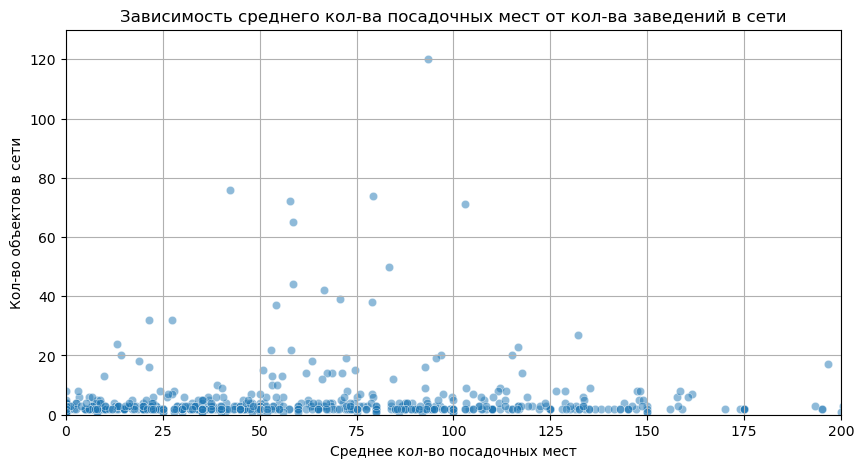

In [31]:
col_in_place = data.query('chain==True').groupby(['name']).agg(count=('name', 'count'), number_mean=('seats','mean'))

plt.figure(figsize=(10, 5))
plt.ylim(0, 130) 
plt.xlim(0, 200)
plt.title('Зависимость среднего кол-ва посадочных мест от кол-ва заведений в сети')
sns.scatterplot(x='number_mean', 
                y='count',
                alpha=0.5,
                data=col_in_place)
plt.xlabel('Среднее кол-во посадочных мест')
plt.ylabel('Кол-во объектов в сети')
plt.grid('major')
plt.show()

Особой корреляции нет. Большинство точек сконцентрировано внизу, это говорит о том, что в сетях в основном находится до 10 заведений. Крупные сети встречаются довольно редко, средние значения посадочных мест в таких заведениях в основном находится в пределах от 60 до 100. Значения количества посадочных мест в сетевых заведениях, в среднем, доходят до 150.

Можно сделать вывод, что наибольшее количество посадочных мест занимают сетевые заведения категории "рестораны" и несетевые заведения категории "бары, пабы".


### Соотношение сетевых и несетевых заведений

In [32]:
chain_places = data.pivot_table(index='chain', values='name', aggfunc='count').reset_index()
chain_places.columns = ['Тип заведения', 'Количество']

display(chain_places.style.background_gradient(cmap=cm)\
        .set_caption("Соотношение сетевых и несетевых заведений"))

fig = px.pie(chain_places, values='Количество', names='Тип заведения',
             title='Соотношение сетевых и несетевых заведений',
             color_discrete_sequence=px.colors.sequential.RdBu,
             hover_name=chain_places['Тип заведения'].map({True: 'сетевые заведения', False:'несетевые заведения'}))
fig.update_traces(pull=[0.05, 0, 0, 0], 
                  textposition='inside', 
                  texttemplate='%{label} %{percent:.0%}',
                  rotation=70,
                  textfont_size=14,
                  insidetextorientation='horizontal',                 
                  labels=chain_places['Тип заведения'].map({True: 'сетевые заведения', False:'несетевые заведения'}))
fig.show()

,Тип заведения,Количество
0,False,5199
1,True,3202


Из диаграммы видим, чтобольшую часть, а именно 62% от рынка общественного питания Москвы занимают несетевые заведения. 

### Какие категории заведений чаще являются сетевыми

Проверим какие категории заведений чаще являются сетевыми.

In [33]:
#Сделаем сводную таблицу со столбцами кол-во сетевых заведений и с общим кол-ом заведений по категориям
chain_cat = data.pivot_table(index='category', values='chain', aggfunc=['sum', 'count'])\
    .reset_index().sort_values(by=(     'sum', 'chain'), ascending=False)
chain_cat.columns = ['Категория заведения', 'Кол-во сетевых', 'Всего заведений']
chain_cat['Процент сетевых'] = round(chain_cat['Кол-во сетевых'] / chain_cat['Всего заведений'] * 100, 2)

#Выведем таблицу и подсветим заведения с наибольшим кол-вом сетевых заведений, 
#а также заведения с наибольшей долей сетевых от общего числа заведений в категории
display(chain_cat.style.background_gradient(cmap=cm)\
        .set_caption("Сетевые категории заведений"))

fig = px.bar(chain_cat, y=['Кол-во сетевых', 'Всего заведений'], x='Категория заведения',
             title='Доля сетевых заведений по отношению к общему количеству заведений по категориям',
             hover_name='Категория заведения',
             barmode="group")

fig.show()

,Категория заведения,Кол-во сетевых,Всего заведений,Процент сетевых
3,кафе,778,2377,32.730000
6,ресторан,730,2041,35.770000
4,кофейня,720,1413,50.960000
5,пиццерия,330,633,52.130000
2,быстрое питание,232,603,38.470000
0,"бар,паб",169,765,22.090000
1,булочная,155,254,61.020000
7,столовая,88,315,27.940000


Если смотреть на график, то наибольшее количество сетевых заведений относятся к категориям: кафе, ресторан и кофейня.

Однако, в сводной таблице, в которой представлены доли в процентном соотношении от общего числа заведений каждой категории, мы видим, что более 61% булочных являются сетевыми, а также сетевые пиццерии занимают более 52% от общего количества пиццерий, а сетевыми являются около 50% кофеен от общего числа кофеен.

Если учитывать оба вида показателей, то заведения относящиеся к категории "кофейни" чаще являются сетевыми. Именно кофейни имеют достаточно большое количественное значение заведений от рынка: общее количество кофеен 1413, при всем количество заведений общепита более 8 тысяч. Также кофейни имеют и большое долевое значение, около 50% от общего числа кофеен являются сетевыми.


### Найдем топ-15 популярных сетей Москвы

Найдем сети заведений который считаются самыми популярными в региона и построим визуализацию.

In [34]:
#Находим топ 15 заведений по наибольшему количеству заведений в сети
top_pop = data.query('chain==True').groupby('name').agg({'name': 'count', 'category':'first'})
top_pop.columns = ['count', 'category']
top_pop = top_pop.reset_index()
top_pop.columns = ['Название сети', 'Кол-во заведений', 'Категория']

#Топ-15
top_pop = top_pop.nlargest(15, 'Кол-во заведений')
display(top_pop.style.background_gradient(cmap=cm)\
        .set_caption("Топ-15 популярных сетей заведений"))

,Название сети,Кол-во заведений,Категория
740,Шоколадница,120,кофейня
343,Домино'с пицца,76,пиццерия
339,Додо Пицца,74,пиццерия
753,Яндекс Лавка,72,ресторан
147,One Price Coffee,71,кофейня
59,Cofix,65,кофейня
169,Prime,50,ресторан
675,Хинкальная,44,быстрое питание
377,КОФЕПОРТ,42,кофейня
429,Кулинарная лавка братьев Караваевых,39,кафе


In [35]:
fig = px.bar(top_pop, y='Кол-во заведений', x='Название сети',
             title='Соотношение кол-ва заведений в топ-15 сетей Москвы',
             hover_name='Название сети',
             text='Кол-во заведений')

fig.update_traces(textfont_size = 12, textposition = 'inside')
fig.show()

Топ-15 сетей, которые у нас получились, знакомы практически каждому, общий признак этих заведений в том, что они относятся к общедоступным заведениям общественного питания со средним ценником. Большинство из этих заведений - это кафе, кофейни и пиццерии, где можно быстро перекусить, особенно это удобно из-за большого количество точек сети по всему региону.


### Исследуем какие районы представлены в датасете

In [36]:
#Сделаем сводную таблицу со столбцами кол-во заведений в регионе по категориям и общим количество заведений 
df = data.pivot_table(index=['district', 'category'], values='name', aggfunc='count')\
    .reset_index().sort_values(by=('name'), ascending=False)
df.columns = ['district', 'category', 'count']   

#Создадим таблицу с районами и общим кол-ом заведений в районе
district_place = df.pivot_table(index='district', values='count', aggfunc='sum')
district_place.columns = ['sum']
district_place = district_place.reset_index().sort_values(by=('sum'), ascending=False)

district_table = df.merge(district_place, how='left', on='district')

district_table.columns = ['Район', 'Категория', 'Кол-во заведений по категориям', 'Всего заведений в регионе']

#Выведем таблицу по убыванию количества заведений в категориях
display(district_table.head(10).style.background_gradient(cmap=cm)\
        .set_caption("Количество заведений по категориям и районам"))

#Выведем таблицу с общим количеством заведейний в районе
district_place.columns = ['Район', 'Кол-во заведений в районе']
display(district_place.head(10).style.background_gradient(cmap=cm)\
        .set_caption("Общее количество заведений по районам"))

,Район,Категория,Кол-во заведений по категориям,Всего заведений в регионе
0,Центральный административный округ,ресторан,670,2241
1,Центральный административный округ,кафе,464,2241
2,Центральный административный округ,кофейня,428,2241
3,Центральный административный округ,"бар,паб",364,2241
4,Юго-Восточный административный округ,кафе,282,714
5,Восточный административный округ,кафе,272,798
6,Северо-Восточный административный округ,кафе,269,890
7,Южный административный округ,кафе,264,892
8,Западный административный округ,кафе,239,850
9,Юго-Западный административный округ,кафе,238,709


,Район,Кол-во заведений в районе
5,Центральный административный округ,2241
2,Северный административный округ,898
8,Южный административный округ,892
3,Северо-Восточный административный округ,890
1,Западный административный округ,850
0,Восточный административный округ,798
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
4,Северо-Западный административный округ,409


In [37]:
fig = px.bar(district_table, y='Кол-во заведений по категориям', x='Район',
             title='Количество заведений по категориям по районам',
             hover_name='Категория',
             color='Категория',
             text='Кол-во заведений по категориям',
             color_continuous_scale=px.colors.sequential.Sunsetdark,
             barmode='stack'
            )

fig.update_traces(textfont_size = 12, textposition = 'inside')

fig.update_layout(height=700, font_size=10, uniformtext_minsize=8, uniformtext_mode='hide')
fig.show()

В датасете присутствуют 9 административных районов Москвы. Самым популярным, по количеству заведений в нем, является Центральный административный округ, в нем находится 2242 заведения всех представленных категорий.


### Средние рейтинги заведений по категориям

Посмотрим как распределены средние рейтинги заведений по категориям и узнаем, сильно ли различаются усредненные рейтинги в разных типах общепита.

In [38]:
avg_rating = data.pivot_table(index='category', values='rating', aggfunc='mean').reset_index()\
    .sort_values(by='rating', ascending=False)
avg_rating['rating'] = round(avg_rating['rating'], 1)
avg_rating.columns = ['Категория', 'Рейтинг']

display(avg_rating.head(10).style.background_gradient(cmap=cm)\
        .set_caption("Средние рейтинги заведений по категориям"))

fig = px.bar(avg_rating, x='Категория', y='Рейтинг',
             title='Средний рейтинг заведений',
             hover_name='Категория',
             color='Рейтинг',
             text='Рейтинг',
             color_continuous_scale=px.colors.sequential.YlGn)
fig.show()

,Категория,Рейтинг
0,"бар,паб",4.400000
5,пиццерия,4.300000
6,ресторан,4.300000
4,кофейня,4.300000
1,булочная,4.300000
7,столовая,4.200000
3,кафе,4.100000
2,быстрое питание,4.100000


Средние рейтинги в разных категориях общепита действительно различаются, хоть и не сильно.

У баров и пабов рейтинг самый высокий - 4.4, у пиццерий, ресторанов, кофеин и булочных средний рейтинг одинаковый - 4.3, у столовых рейтинг чуть ниже - 4.2, у кафе и заведений быстрого питания самый низкий средний рейтинг - 4.1.

Ранее мы узнавали, что к самым популярным по количеству сетям относятся именно рестораны, пиццерии и кофейни. Теперь мы видим, что несмотря на популярность, а значит на большое количество заведений питания данного типа, рейтинги у них примерно одинаковые и являются достаточно высокими по сравнению с остальными категориями заведений.


### Хороплет со средним рейтингом заведений каждого района

Построим фоновую картограмму со средним рейтингом заведений каждого района.

In [39]:
rating_df = data.groupby('district', as_index=False)['rating'].agg('median')
rating_df.columns = ['Район', 'Средний рейтинг']

display(rating_df.head(10).style.background_gradient(cmap=cm)\
        .set_caption("Средние рейтинги заведений по районам"))

,Район,Средний рейтинг
0,Восточный административный округ,4.300000
1,Западный административный округ,4.300000
2,Северный административный округ,4.300000
3,Северо-Восточный административный округ,4.200000
4,Северо-Западный административный округ,4.300000
5,Центральный административный округ,4.400000
6,Юго-Восточный административный округ,4.200000
7,Юго-Западный административный округ,4.300000
8,Южный административный округ,4.300000


In [40]:
# читаем JSON-файл с границами округов Москвы и сохраняем в переменной
with open('dataset/admin_level_geomap.geojson', 'r',\
          encoding="utf-8") as f:
    geo_json = json.load(f)

# выводим на экран содержимое, чтобы убедиться, что данные отображены правильно
print(json.dumps(geo_json, indent=2, ensure_ascii=False, sort_keys=True))

{
  "features": [
    {
      "geometry": {
        "coordinates": [
          [
            [
              [
                37.8756653,
                55.825342400000004
              ],
              [
                37.876001599999995,
                55.8249027
              ],
              [
                37.8730967,
                55.8237936
              ],
              [
                37.8689418,
                55.8228697
              ],
              [
                37.869206999999996,
                55.822363200000005
              ],
              [
                37.868322500000005,
                55.822211100000004
              ],
              [
                37.867472,
                55.823703
              ],
              [
                37.86851090000001,
                55.82391880000001
              ],
              [
                37.87046039999999,
                55.8242706
              ],
              [
                37.87172779999

In [41]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    #используем ранее загруженный файл с границами округов Москвы
    geo_data=geo_json,
    data=rating_df,
    columns=['Район', 'Средний рейтинг'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам Москвы',
).add_to(m)

# выводим карту
m

На карте видим, что самый высокий средний рейтинг заведений имеет Центральный административный округ, при этом Юго-восточный и северо-восточный районы имеют самый низкий средний рейтинг.

Отобразим все заведения датасета на карте с помощью кластеров.


In [42]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

Отобразили все заведения общественного питания Москвы на карте.

### Топ-15 улиц по количеству заведений

Найдем топ-15 улиц по количеству заведений в Москве. Построим график распределения количества заведений и их категорий по улицам.

In [43]:
#Находим топ 15 улиц по количеству заведений в Москве
df_top_street = data.groupby('street', as_index=False).agg({'name': 'count'})\
    .sort_values(by='name', ascending=False).nlargest(15, 'name')
df_top_street.columns = ['Название улицы', 'Кол-во заведений']

display(df_top_street.style.background_gradient(cmap=cm).set_caption("Топ-15 улиц по количеству заведений"))

df_cat_street = data.groupby(['street', 'category'], as_index=False).agg({'name': 'count'})\
    .sort_values(by='name', ascending=False)
df_cat_street.columns = ['Название улицы', 'Категория', 'Кол-во заведений по категориям']
df_cat_street = df_top_street.merge(df_cat_street, how='left', on='Название улицы')\
    .sort_values(by='Кол-во заведений по категориям', ascending=False)

display(df_cat_street.head(10).style.background_gradient(cmap=cm)\
        .set_caption("Количество заведений по категориям"))

,Название улицы,Кол-во заведений
1090,проспект Мира,183
773,Профсоюзная улица,122
1087,проспект Вернадского,108
525,Ленинский проспект,107
523,Ленинградский проспект,95
373,Дмитровское шоссе,88
455,Каширское шоссе,77
298,Варшавское шоссе,76
524,Ленинградское шоссе,70
550,МКАД,65


,Название улицы,Кол-во заведений,Категория,Кол-во заведений по категориям
0,проспект Мира,183,кафе,53
70,МКАД,65,кафе,45
1,проспект Мира,183,ресторан,44
2,проспект Мира,183,кофейня,36
8,Профсоюзная улица,122,кафе,35
24,Ленинский проспект,107,ресторан,33
16,проспект Вернадского,108,ресторан,33
25,Ленинский проспект,107,кафе,26
76,Люблинская улица,60,кафе,26
62,Ленинградское шоссе,70,ресторан,26


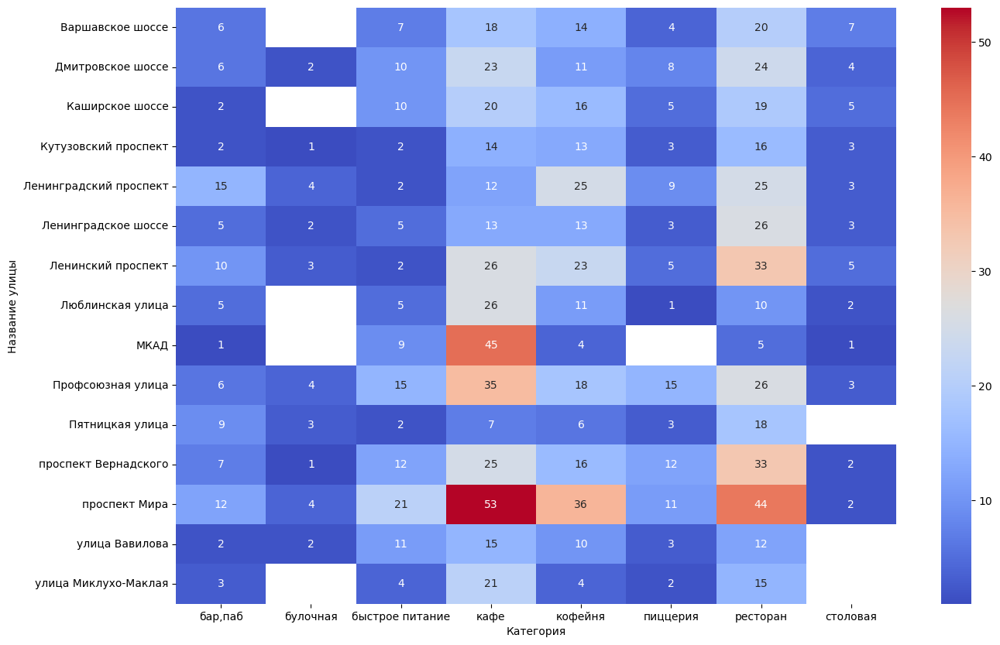

In [44]:
warnings.filterwarnings("ignore")
df_heatmap = df_cat_street.pivot('Название улицы', 'Категория', 'Кол-во заведений по категориям')
df_heatmap
plt.figure(figsize=(15, 10))
sns.heatmap(df_heatmap, annot=True, cmap="coolwarm")
plt.show()

Из тепловой карты видим, что самой горячей улицей является проспект Мира. Именно на проспекте Мира находится больше всего кафе, ресторанов и кофеен.

Также популярными являютя Профсоюзная улица, на ней достаточно много кафе - 35, ресторанов - 26, и Ленинский проспект, на нем 33 ресторана, 26 кафе и 23 кофейни..

Ранее мы изображали карту заведений со средним рейтингом, на ней самый высокий рейтинг кафе был в центре, а в сторону северо-востока рейтинг сильно снижался. Проспект мира начинается как раз в том месте, где рейтинги заведений были самыми высокими и постепенно переходит в северо-восточную зону с самыми низкими рейтингами, сейчас мы выяснили, что на Проспекте Мира самое большое количество заведений.


### Улицы с одним заведение общепита

Найдем улицы, на которых находится только 1 заведение общепита.

In [45]:
#Находим улицы, на которых 1 объект
df_one = data.groupby('street', as_index=False).agg({'name': 'count'})
df_one.columns = ['street', 'count']
df_one = df_one.query('count == 1')
df_one.head(10)

,street,count
0,1-й Автозаводский проезд,1
1,1-й Балтийский переулок,1
2,1-й Варшавский проезд,1
3,1-й Вешняковский проезд,1
5,1-й Голутвинский переулок,1
6,1-й Грайвороновский проезд,1
7,1-й Дербеневский переулок,1
9,1-й Земельный переулок,1
10,1-й Капотнинский проезд,1
11,1-й Кирпичный переулок,1


Отметим заведения на этих улицах на карте, чтобы посмотреть, есть ли какая-то взаимосвязь с расположением этих улиц или заведений на них.


In [46]:
street_location = df_one.merge(data, how='left', on='street')
street_location.head()

,street,count,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_24_7,name_lower
0,1-й Автозаводский проезд,1,Чайхана Азия,кафе,"Москва, 1-й Автозаводский проезд, 5",Южный административный округ,"ежедневно, круглосуточно",55.704847,37.657065,4.2,средние,Средний счёт:190–350 ₽,270.0,NaN,True,20,True,чайхана азия
1,1-й Балтийский переулок,1,Хуан Хэ,ресторан,"Москва, 1-й Балтийский переулок, 3/25",Северный административный округ,"ежедневно, 12:00–22:00",55.810418,37.518824,4.4,высокие,Средний счёт:1500–2000 ₽,1750.0,NaN,False,60,False,хуан хэ
2,1-й Варшавский проезд,1,Колизей,кафе,"Москва, 1-й Варшавский проезд, 1Ас9",Южный административный округ,пн-чт 10:00–00:00; пт-вс 10:00–05:00,55.648674,37.627979,4.0,NaN,NaN,NaN,NaN,False,0,False,колизей
3,1-й Вешняковский проезд,1,Deli by Shell,кафе,"Москва, 1-й Вешняковский проезд, 15",Юго-Восточный административный округ,NaN,55.723152,37.794014,3.4,NaN,NaN,NaN,NaN,False,0,False,deli by shell
4,1-й Голутвинский переулок,1,Shelby,"бар,паб","Москва, 1-й Голутвинский переулок, 6",Центральный административный округ,пн-пт 09:00–20:00,55.739600,37.613494,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,False,22,False,shelby


In [47]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# применяем функцию create_clusters() к каждой строке датафрейма
street_location.apply(create_clusters, axis=1)

# выводим карту
m

Можно заметить, что большинство улиц, на которых находится 1 заведение, являются проездами или переулками, а не главными артериями города.

Проверим, если ли еще какая-то взаимосвязь, например между улицами и категориями заведений. Для этого посчитаем количество заведений на этих улицах по категориям.


In [48]:
rest = street_location.groupby('category', as_index=False)['name'].count()
rest.columns = ['Категория', 'Кол-во заведений']

display(rest.head(10).style.background_gradient(cmap=cm)\
        .set_caption("Количество заведений по категориям на улицах с 1 заведением"))

,Категория,Кол-во заведений
0,"бар,паб",39
1,булочная,8
2,быстрое питание,23
3,кафе,160
4,кофейня,84
5,пиццерия,15
6,ресторан,93
7,столовая,36


Можно заметить, что большинство таких заведений являются "кафе", их почти в 2 раза больше чем ресторанов и кофеен. На популярных улицах ранее мы замечали, что количество кафе, ресторанов и кофеен находилось примерно на одном уровне.


### Влияние удаленности от центра на цены

Посчитаем медиану средних чеков заведений для каждого района. Используем это значение в качестве ценового индикатора района. Построим построим фоновую картограмму с полученными значениями для каждого района. Проанализируем цены в центральном административном округе и других, и узнаем как удаленность от центра влияет на цены в заведениях.

In [49]:
mid_bill = data.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
mid_bill.columns = ['Район', 'Средний чек']
display(mid_bill.head(10).style.background_gradient(cmap=cm)\
        .set_caption("Распределение средних чеков по районам"))

,Район,Средний чек
0,Восточный административный округ,575.000000
1,Западный административный округ,1000.000000
2,Северный административный округ,650.000000
3,Северо-Восточный административный округ,500.000000
4,Северо-Западный административный округ,700.000000
5,Центральный административный округ,1000.000000
6,Юго-Восточный административный округ,450.000000
7,Юго-Западный административный округ,600.000000
8,Южный административный округ,500.000000


In [50]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=mid_bill,
    columns=['Район', 'Средний чек'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по районам Москвы',
).add_to(m)

m

Удаленность от центра влияет на среднюю стоимость чека в заведении. К районам с самым высоким средним чеком относятся Центральный и Западный административные районы.

К районам с самым низким средним чеком относятся Восточный, Юго-Восточный и Северо-Восточный административные районы.


### Вывод

В данном разделе мы выяснили, что в датасете представлено 8406 заведений 8-ми категорий общественного питания Москвы: 
- 2378 кафе,
- 2043 ресторана,
- 1413 кофеен,
- 765 пабов и баров,
- 633 пиццерии,
- 603 заведения быстрого питания,
- 315 столовых,
- 256 булочных.

При этом наибольшее количество посадочных мест приходилось на рестораны и бары. В сетевых заведениях больше посадочных мест в ресторанах, а в несетевых - в барах.

Мы выяснили что 62% заведений общественного питания Москвы не являются сетевыми.

Что касается сетевых заведений, наибольший процент булочных являются сетевыми, а именно 61% от всех булочных. При этом, если будем смотреть именно на количество сетевых заведений, а не процент, то преобладают кафе, их 779 сетевых, далее идут рестораны - 730 и кофейни - 720.

Из топ-15 сетей заведений Москвы, лидируют Шоколадница - 120 заведений, Домино"с пицца - 76 заведения и Додо Пицца - 74 заведения. Большинство заведений из топ-15 относятся к категориям кофейни, пиццерии, рестораны и кафе. 

Самым популярным из представленных районов Москвы является Центральный административный округ. В нем находятся 2242 заведения общественного питания. В нем самое большое количество ресторанов - 670, кафе - 464 и кофеен - 428.

Самые высокие средние рейтинги заведений оказались у пабов и баров - 4.4. Что касается расположения заведений, то рейтинг 4.4 в среднем получают заведения из Центрального административного округа.

Самой популярной улицей по количеству заведений оказалась проспект Мира, на нем находятся 184 заведения общественного питания, из них 53 кафе 45 ресторанов и 36 кофеен. Далее идут Профсоюзная улица - 122 заведения и проспект Вернадского - 108 заведений.

Улицы с одним заведением общепита на ней являются переулками и проездами, а не главными улицами региона. На улицах с одним заведениям чаще всего заведения являются кафе.

Наиболее высокие средние чеки у заведений расположенных в Западном административном округе и в Центральном административном округе, здесь средний чек составляет 1000р. Самые дешевые средние чеки в Северо-Восточном, Юго-Восточном и Южном округах. Также в Северо-Восточном и Юго-Восточном округах самые низкие рейтинги у заведений общественного питания.

## Детализируем исследование: открытие кофейни

Всего в датасете представлено 1413 кофеен. 

In [51]:
coffee_district = data.query('category == "кофейня"').groupby('district', as_index=False)['name']\
    .count().sort_values(by='name', ascending=False)
coffee_district.columns = ['Район', 'Кол-во кофеен']
display(coffee_district.style.background_gradient(cmap=cm)\
        .set_caption("Количество кофеен по районам"))

,Район,Кол-во кофеен
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


Больше всего кофеен, а именно 428, находяится в Центральном административном округе.


In [52]:
coffee_street = data.query('category == "кофейня"').groupby('street', as_index=False)['name']\
    .count().sort_values(by='name', ascending=False)
coffee_street.columns = ['Улица', 'Кол-во кофеен']
display(coffee_street.head().style.background_gradient(cmap=cm)\
        .set_caption("Количество кофеен по улицам"))

,Улица,Кол-во кофеен
476,проспект Мира,36
212,Ленинградский проспект,25
214,Ленинский проспект,23
331,Профсоюзная улица,18
474,проспект Вернадского,16


 **Больше всего кофеен находится в Центральном административном округе на проспекте Мира**, там их 36, также много кофеен на Ленинградском и Ленинском проспектах, там их 25 и 23 соответсвенно. 
 
 Для того, чтобы узнать есть ли круглосуточные кофейни, построим таблицу.


In [53]:
fulltime_coffee = data.query('category == "кофейня" and is_24_7 == True')
print('Всего круглосуточных кофеен', len(fulltime_coffee))
fulltime_coffee.head()

Всего круглосуточных кофеен 59


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7,name_lower
200,Wild Bean,кофейня,"Москва, Дмитровское шоссе, 107Е",Северный административный округ,"ежедневно, круглосуточно",55.878477,37.543426,3.5,NaN,NaN,NaN,NaN,True,20,Дмитровское шоссе,True,wild bean
971,Wild Bean Cafe,кофейня,"Москва, Ярославское шоссе, 116",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.867822,37.708853,4.0,NaN,NaN,NaN,NaN,True,25,Ярославское шоссе,True,wild bean cafe
1047,Wild Bean Cafe,кофейня,"Москва, Ярославское шоссе, вл3с3",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.851778,37.676423,4.5,NaN,Цена чашки капучино:140–200 ₽,NaN,170.0,True,0,Ярославское шоссе,True,wild bean cafe
1214,Wild Bean Cafe,кофейня,"Москва, МКАД, 65-й километр, 8",Северо-Западный административный округ,"ежедневно, круглосуточно",55.813787,37.390701,4.3,NaN,NaN,NaN,NaN,True,0,МКАД,True,wild bean cafe
1291,Шоколадница,кофейня,"Москва, улица Народного Ополчения, 49, корп. 1",Северо-Западный административный округ,"ежедневно, круглосуточно",55.794815,37.494834,4.2,средние,Средний счёт:650–850 ₽,750.0,NaN,True,200,улица Народного Ополчения,True,шоколадница


Посмотрим какие у кофеен обычно средние рейтинги по районам.

In [54]:
cof_distr_rat = data.query('category == "кофейня"').groupby('district', as_index=False)['rating'].agg('median')
cof_distr_rat.columns = ['Район', 'Средний рейтинг']

display(cof_distr_rat.style.background_gradient(cmap=cm)\
        .set_caption("Распределение средних рейтингов по районам"))

,Район,Средний рейтинг
0,Восточный административный округ,4.300000
1,Западный административный округ,4.200000
2,Северный административный округ,4.300000
3,Северо-Восточный административный округ,4.300000
4,Северо-Западный административный округ,4.300000
5,Центральный административный округ,4.300000
6,Юго-Восточный административный округ,4.300000
7,Юго-Западный административный округ,4.300000
8,Южный административный округ,4.300000


In [55]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=cof_distr_rat,
    columns=['Район', 'Средний рейтинг'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам Москвы',
).add_to(m)

m

Во всех районах у кофеен рейтинги примерно одинаковые, кроме западного административного округа, средний рейтинг кофеен в этой районе ниже остальных.

Посчитаем, на какую стоимость чашки капучино стоит ориентироваться при открытии кофейни.


In [56]:
coffee_cup = data.query('category == "кофейня"')
print('Средняя стоимость чашки капучино', \
      round(coffee_cup['middle_coffee_cup'].mean()), 'рублей.')

Средняя стоимость чашки капучино 175 рублей.


Проверим какая средняя стоимость кофе в Центральном административном округе.


In [57]:
coffee_cup = data.query('category == "кофейня" and district == "Центральный административный округ"')
print('Средняя стоимость чашки капучино в Центральном административном округе', \
      round(coffee_cup['middle_coffee_cup'].mean()), 'рублей.')

Средняя стоимость чашки капучино в Центральном административном округе 188 рублей.


In [58]:
coffee_cup = data.query('category == "кофейня" and district ==\
    "Центральный административный округ" and is_24_7 == True')
print('Средняя стоимость чашки капучино в Центральном административном округе в круглосуточной кофейне', \
      round(coffee_cup['middle_coffee_cup'].mean()), 'рублей.')

Средняя стоимость чашки капучино в Центральном административном округе в круглосуточной кофейне 217 рублей.


In [59]:
coffee_cup = data.query('category == "кофейня" and district ==\
    "Центральный административный округ" and is_24_7 == False')
print('Средняя стоимость чашки капучино в Центральном административном округе в кофейне не круглосуточной', \
      round(coffee_cup['middle_coffee_cup'].mean()), 'рублей.')

Средняя стоимость чашки капучино в Центральном административном округе в кофейне не круглосуточной 187 рублей.


Проверим, какого типа кофейни встречаются чаще: там где берут напитки на вынос (например в кофе-точках или фудкортах), или там кофейни, в которых можно посидеть и выпить кофе.


In [60]:
print('Количество кофеен, в которых есть места для посетителей, равно',\
      data.query('category == "кофейня" and seats > 0', engine='python')['name'].count())
print('Количество кофеен, которые работают только на вынос, равно',\
      data.query('category == "кофейня" and seats == 0', engine='python')['name'].count())

Количество кофеен, в которых есть места для посетителей, равно 727
Количество кофеен, которые работают только на вынос, равно 686


Кофеен, в которых можно остаться, провести время и попить кофе явно больше.

**Вывод:**

Так как заказчики не боятся конкуренции в сфере общественного питания, то из всего вышеописанного можно порекомендовать следующее: кофейню действительно **можно открыть** и для этого рассмотреть варианты расположения с более высокой конкуренцией, зато более прибыльные. 

Для открытия лучше выбрать **проспект Мира**, расположение должно быть таким, чтобы кофейня на этой улице входила в **Центральный административный округ**. Именно в этом районе сосредоточено больше всего кофеен и самые высокие рейтинги у заведений, а также высокая стоимость кофе. В отличие от общей средней стоимости чашки капучино в 175 рублей, в этом районе **стоимость чашки в районе 188 рублей**, именно на эту стоимость и стоит ориентироваться при открытии. Однако, если сделать кофейню круглосуточной, то стоимость кофе можно увеличить до 217 рублей, так как в этой зоне у кофеен круглосуточных средняя стоимость кофе выше.

Презентация:  https://disk.yandex.ru/i/XlGDwaIEytUbww